In [1]:
# system functions that are always useful to have
import time, sys, os

# basic numeric setup
import numpy as np

# inline plotting
%matplotlib inline

# plotting
import matplotlib
from matplotlib import pyplot as plt
import scienceplots

plt.style.use(['science', 'grid', 'high-vis'])

# seed the random number generator
rstate = np.random.default_rng(113)

In [2]:
# re-defining plotting defaults
from matplotlib import rcParams
rcParams.update({'xtick.major.pad': '7.0'})
rcParams.update({'xtick.major.size': '7.5'})
rcParams.update({'xtick.major.width': '1.5'})
rcParams.update({'xtick.minor.pad': '7.0'})
rcParams.update({'xtick.minor.size': '3.5'})
rcParams.update({'xtick.minor.width': '1.0'})
rcParams.update({'ytick.major.pad': '7.0'})
rcParams.update({'ytick.major.size': '7.5'})
rcParams.update({'ytick.major.width': '1.5'})
rcParams.update({'ytick.minor.pad': '7.0'})
rcParams.update({'ytick.minor.size': '3.5'})
rcParams.update({'ytick.minor.width': '1.0'})
rcParams.update({'font.size': 15})
rcParams.update({'figure.dpi': 300})

In [3]:
import dynesty
import GPy
import celerite
from celerite import terms

### Red noise (real LC):

$$ y(t) = \sum \Delta t \cdot dist $$

where $ dist \sim N(0, \sigma)$

### Tick-tock signal:

$$ y(t) = A(t) \sin (2\pi ~f(t) ~t) $$

where $ A(t) = \exp(-gt) $, $g$ is the amplitude damping factor, and $f(t) = \frac{\exp(ht)}{T_{init}}$, $h$ being the frequency damping factor and $T_{init}$ the initial period.

Q: Can we use `dynesty` to get posteriors for $g$, $h$, and $T_{init}$ and maybe even $\sigma$ for the tick-tock signal?

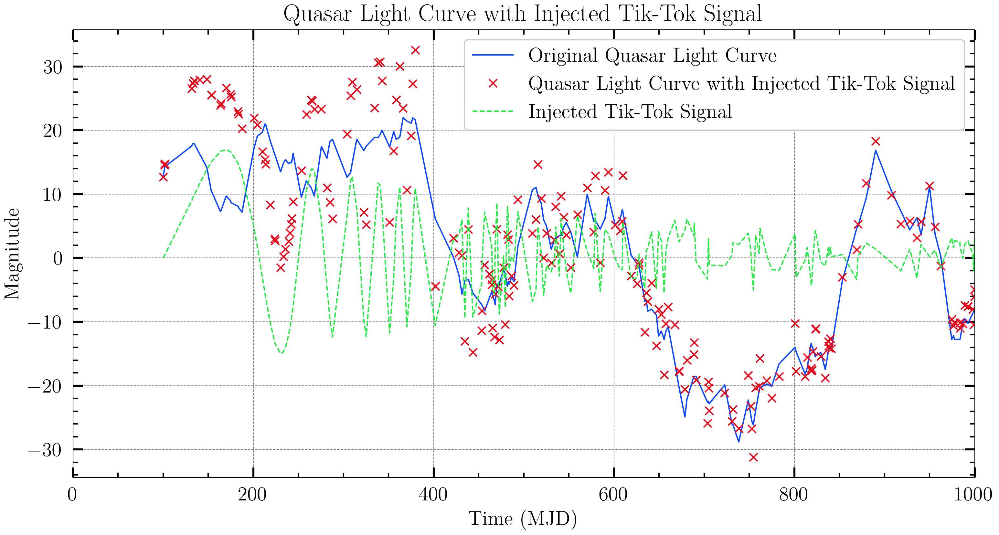

In [4]:
from scipy.interpolate import interp1d

# np.random.seed(113)

def generate_red_noise(time_instances, sigma=0.1):
    delta_t = np.diff(time_instances, prepend=time_instances[0])
    disturbances = rstate.normal(scale=sigma, size=len(time_instances))
    red_noise = np.cumsum(delta_t * disturbances)
    # print(np.max(disturbances))
    return red_noise - red_noise.mean()

def generate_tiktok_signal(time_instances, initial_period, damping_factor_amplitude, damping_factor_frequency):
    frequency = np.exp(damping_factor_frequency * time_instances) / (initial_period)
    amplitude = np.exp(-damping_factor_amplitude * time_instances)
    tiktok_signal = amplitude * np.sin(2 * np.pi * frequency * time_instances)
    return tiktok_signal

def inject_tiktok_to_light_curve(real_times, real_light_curve, initial_period, damping_factor_amplitude, damping_factor_frequency, snr=None, inject_signal=False):
    if not inject_signal:
        return real_light_curve, np.zeros_like(real_light_curve)

    t = np.linspace(real_times.min(), real_times.max(), 5 * len(real_times))
    tiktok_signal_regular = generate_tiktok_signal(t - t.min(), initial_period, damping_factor_amplitude, damping_factor_frequency)

    if snr is not None:
        noise_power = np.var(real_light_curve)
        signal_power = noise_power * snr
        scale_factor = np.sqrt(signal_power)
        tiktok_signal_regular *= scale_factor

    interpolator = interp1d(t, tiktok_signal_regular, kind='linear', fill_value="extrapolate")
    tiktok_signal_interpolated = interpolator(real_times)

    combined_light_curve = real_light_curve + tiktok_signal_interpolated
    return combined_light_curve, tiktok_signal_interpolated

real_times = np.sort(rstate.uniform(100, 1000, 200))
real_light_curve = generate_red_noise(real_times, sigma=0.5)  # Adjust sigma as needed

initial_period = 500
damping_factor_amplitude = 0.002
damping_factor_frequency = 0.008
snr = 2
inject_signal = True

combined_light_curve, tiktok_signal = inject_tiktok_to_light_curve(
    real_times,
    real_light_curve,
    initial_period,
    damping_factor_amplitude,
    damping_factor_frequency,
    snr,
    inject_signal
)

plt.figure(figsize=(12, 6))
plt.plot(real_times, real_light_curve, label='Original Quasar Light Curve')
if inject_signal:
    plt.plot(real_times, combined_light_curve, 'x', label='Quasar Light Curve with Injected Tik-Tok Signal')
    plt.plot(real_times, tiktok_signal, label='Injected Tik-Tok Signal', linestyle='--')
plt.xlim(0,1000)
plt.xlabel('Time (MJD)')
plt.ylabel('Magnitude')
plt.title('Quasar Light Curve with Injected Tik-Tok Signal')
plt.legend()
plt.show()

## Simple tick-tock signal

In [4]:
def try_generate_tiktok_signal(time_instances, params):
    T_init, g = params
    frequency = 1 / (T_init)
    amplitude = np.exp(-g * time_instances)
    tiktok_signal = amplitude * np.sin(2 * np.pi * frequency * time_instances)
    return tiktok_signal

In [5]:
T_init, g = 500, 0.002
real_times = np.sort(rstate.uniform(100,1000,200))
trial = try_generate_tiktok_signal(real_times, (T_init, g))

# parameters for SHO
logs0 = np.log(np.exp(-g*T_init))
logQ = np.log(T_init/(2*np.pi))
logomega0 = np.log((2*np.pi)/T_init)

0.11496574258049724


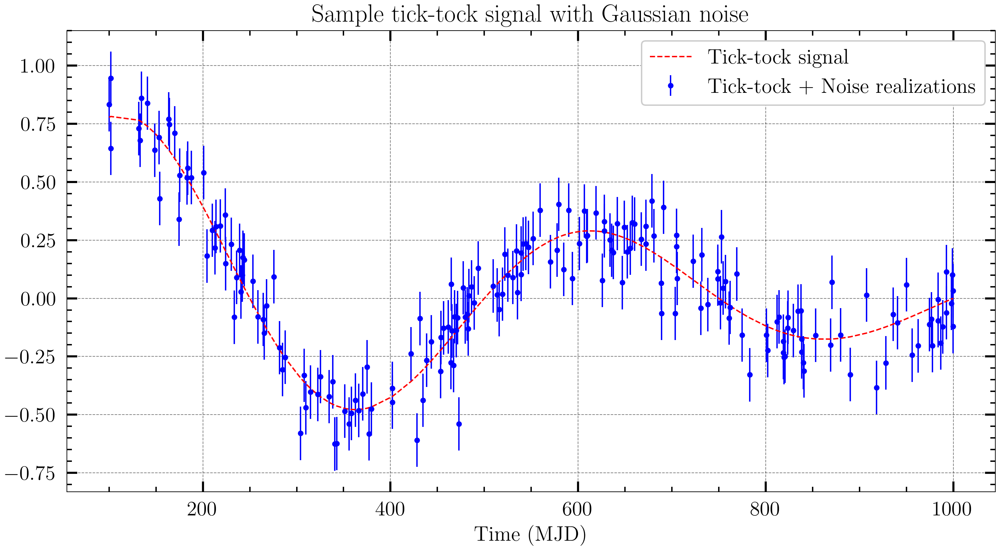

In [6]:
np.random.seed(1234)
meansigma = np.mean(0.5*np.abs(trial))
print(meansigma)
# y = rstate.normal(trial, meansigma)
y = trial + meansigma*np.random.normal(size=len(real_times))
plt.figure(figsize=(12,6))
plt.errorbar(real_times, y, yerr=meansigma, fmt='b.', label='Tick-tock + Noise realizations')
plt.plot(real_times, trial, 'r--', label='Tick-tock signal')
plt.xlabel('Time (MJD)')
plt.title('Sample tick-tock signal with Gaussian noise')
plt.legend(loc='best')

## Testing celerite

In [7]:
# Define the celerite model (replace this with your specific model)
kernel = terms.SHOTerm(log_S0=np.var(y), log_Q=0.0, log_omega0=logomega0)
gp = celerite.GP(kernel)
gp.compute(real_times, yerr=meansigma)

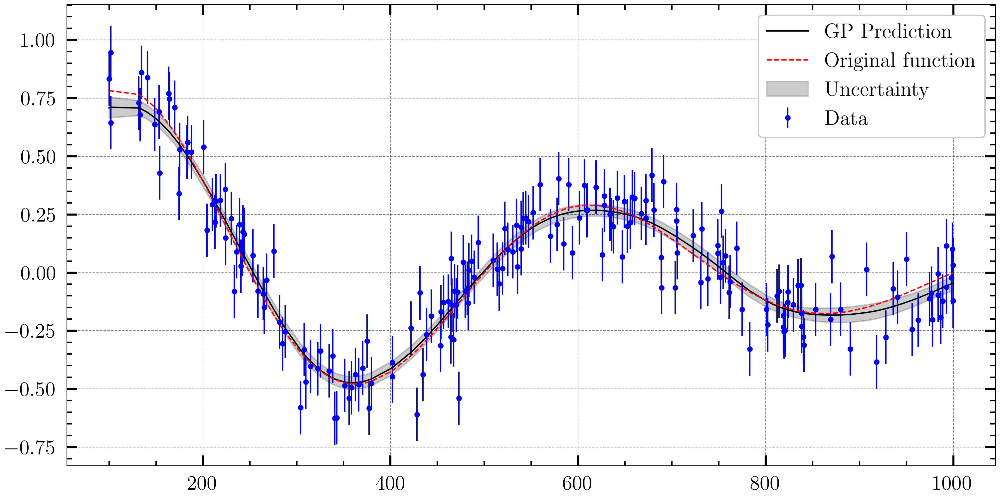

In [8]:
pred_mean, pred_var = gp.predict(y, return_var=True)

plt.figure(figsize=(12,6))
# Plot the data
plt.errorbar(real_times, y, yerr=meansigma, fmt='.b', capsize=0, label='Data')

# Plot the GP prediction
plt.plot(real_times, pred_mean, label='GP Prediction', color='black')

# Plot the original tick-tock signal
plt.plot(real_times, trial, 'r--', label='Original function')

# Shade the uncertainty region
plt.fill_between(real_times, pred_mean - np.sqrt(pred_var), pred_mean + np.sqrt(pred_var), color='black', alpha=0.2, label='Uncertainty')

plt.legend(loc='best')

In [9]:
# Define the log-likelihood function
def log_likelihood(params):
    # Set the celerite kernel parameters
    kernel_params = params
    gp.kernel.set_parameter_vector(kernel_params)

    # Set the mean parameter (no mean parameter for this case)
#     mean_param = params[-1]
#     gp.mean = mean_param

    # Compute the log likelihood
    return gp.log_likelihood(y)

# Define the prior transform
def ptform(u):
    """
    Transforms from u~[0,1) to parameter space of interest
    """
    ulogs0, ulogQ, ulogomega0 = u
    logs0 = 5*(ulogs0*2 - 1) # log s0 = [-5, 5]
    logQ = 5*(ulogQ*2 - 1)
    logomega0 = 5*(ulogomega0*2 - 1)
    
    return logs0, logQ, logomega0

In [11]:
# sampler for evidence estimation
sampler_s = dynesty.DynamicNestedSampler(log_likelihood, ptform, ndim=3,
                                bound='multi', sample='rslice', nlive=2000,
                               rstate=rstate)
sampler_s.run_nested()
res_s = sampler_s.results

31312it [01:45, 296.68it/s, batch: 1 | bound: 4 | nc: 1 | ncall: 702420 | eff(%):  4.104 | loglstar: 130.287 < 132.682 < 131.834 | logz: 125.148 +/-  0.057 | stop:  0.647]          


In [13]:
# sampler for MAP estimation
sampler_s.reset()
sampler_s.run_nested(nlive_init=2000, nlive_batch=500, wt_kwargs={'pfrac': 1.0}, stop_kwargs={'pfrac': 1.0})
respos_s = sampler_s.results

27425it [01:30, 302.98it/s, batch: 1 | bound: 5 | nc: 1 | ncall: 628884 | eff(%):  4.259 | loglstar: 130.355 < 132.688 < 131.840 | logz: 125.242 +/-  0.057 | stop:  0.908]          


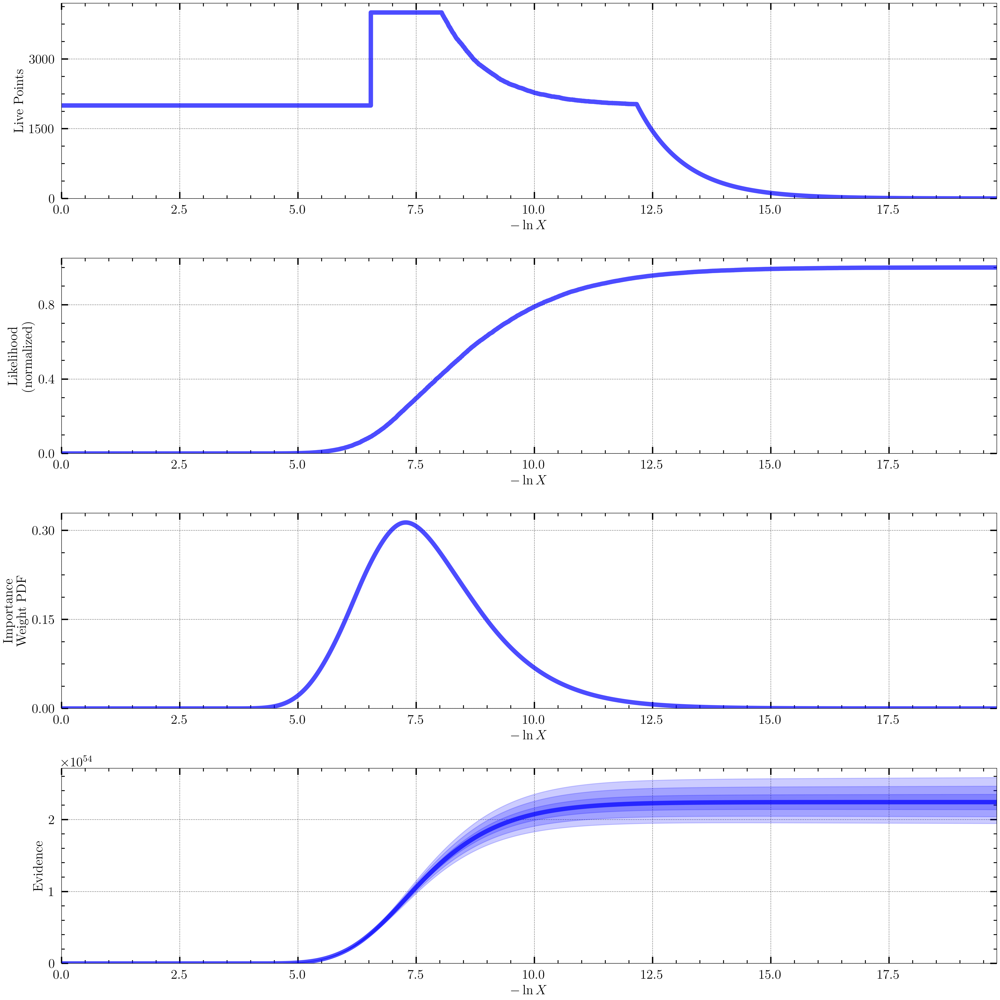

In [14]:
from dynesty import plotting as dyplot

dyplot.runplot(res_s)
plt.tight_layout()

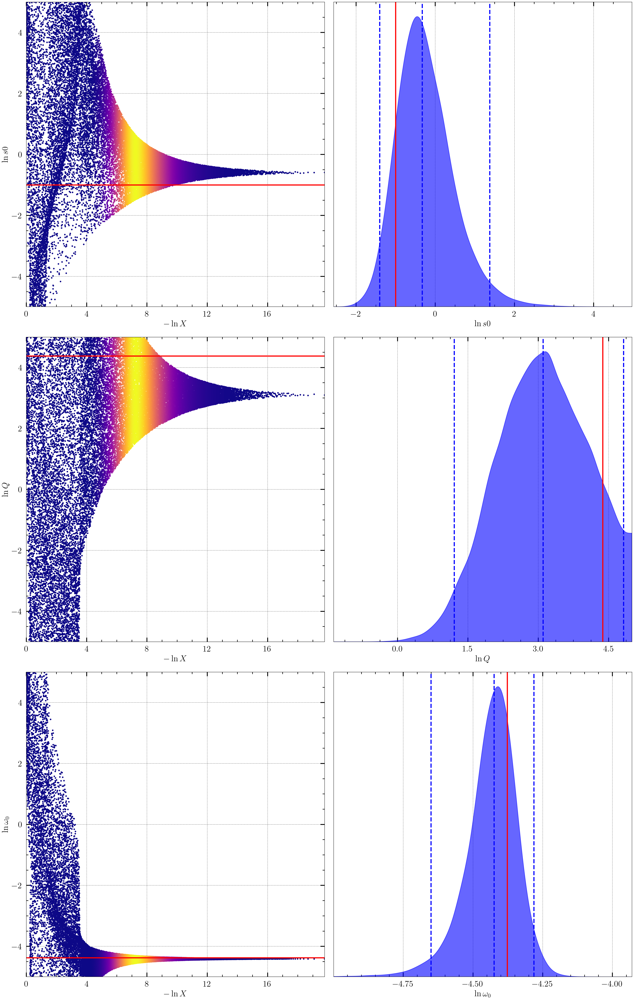

In [15]:
labels = [r'$\ln s0$', r'$\ln Q$', r'$\ln \omega_0$']
truths = [logs0, logQ, logomega0]
fig, axes = dyplot.traceplot(res_s, labels=labels, truths=truths,
                             fig=plt.subplots(3, 2, figsize=(16, 25)))
fig.tight_layout()

In [16]:
fig, axes = dyplot.cornerplot(respos_s, truths=truths, show_titles=True, 
                              title_kwargs={'y': 1.04}, labels=labels,
                              fig=plt.subplots(3,3, figsize=(35, 35)))

## Combined tick-tock and red noise signal

In [16]:
# Define the celerite model (replace this with your specific model)
ker1 = terms.SHOTerm(log_S0=np.log(np.var(combined_light_curve)), log_Q=np.log(initial_period/(2*np.pi)), log_omega0=np.log(2*np.pi/initial_period))
ker2 = terms.RealTerm(log_a=np.log(np.var(combined_light_curve)), log_c=np.log(damping_factor_amplitude))
gp = celerite.GP(kernel=ker1+ker2)
gp.compute(real_times)

 /tmp/ipykernel_591/2358462251.py:14: RuntimeWarning:invalid value encountered in sqrt


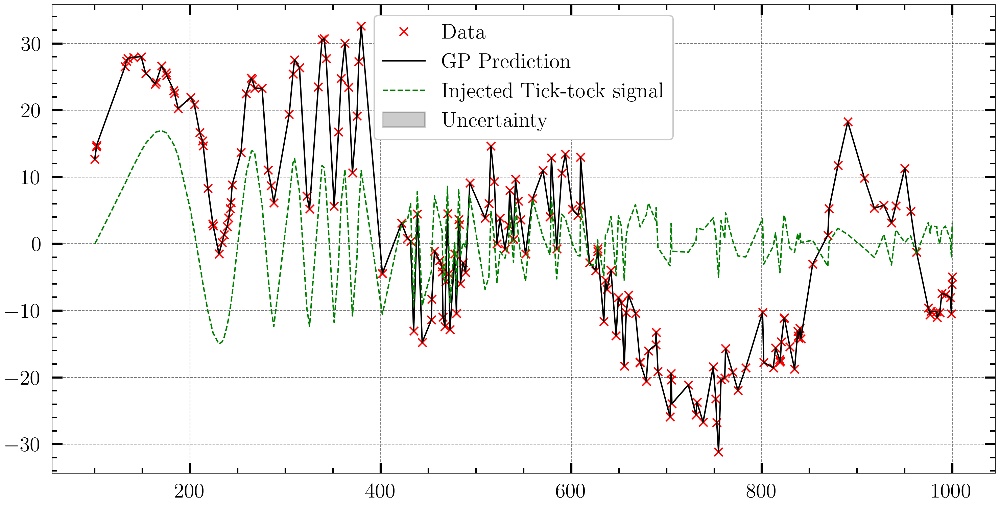

In [17]:
pred_mean, pred_var = gp.predict(combined_light_curve, return_var=True)

plt.figure(figsize=(12,6))
# Plot the data
plt.plot(real_times, combined_light_curve, 'rx', label='Data')

# Plot the GP prediction
plt.plot(real_times, pred_mean, label='GP Prediction', color='black')

# Plot the original tick-tock signal
plt.plot(real_times, tiktok_signal, 'g--', label='Injected Tick-tock signal')

# Shade the uncertainty region
plt.fill_between(real_times, pred_mean - np.sqrt(pred_var), pred_mean + np.sqrt(pred_var), color='black', alpha=0.2, label='Uncertainty')

plt.legend(loc='best')

In [20]:
gp.get_parameter_names()

('kernel:terms[0]:log_S0',
 'kernel:terms[0]:log_Q',
 'kernel:terms[0]:log_omega0',
 'kernel:terms[1]:log_a',
 'kernel:terms[1]:log_c')

In [21]:
# Define the log-likelihood function
def log_likelihood(params):
    # Set the celerite kernel parameters
    kernel_params = params
    gp.kernel.set_parameter_vector(kernel_params)

    # Set the mean parameter (no mean parameter for this case)
#     mean_param = params[-1]
#     gp.mean = mean_param

    # Compute the log likelihood
    return gp.log_likelihood(combined_light_curve)

# Define the prior transform; should return the same order as the parameter names indicated above
def ptform(u):
    """
    Transforms from u~[0,1) to parameter space of interest
    """
    ulogs0, ulogQ, ulogomega0, uloga, ulogc = u
    logs0 = 10*(ulogs0*2 - 1) # log s0 = [-10, 10]
    logQ = 10*(ulogQ*2 - 1)
    logomega0 = 10*(ulogomega0*2 - 1)
    loga = 10*(uloga*2 - 1)
    logc = 10*(ulogc*2 - 1)
    
    return logs0, logQ, logomega0, loga, logc

In [22]:
# sampler for evidence estimation
sampler = dynesty.DynamicNestedSampler(log_likelihood, ptform, ndim=5,
                                bound='multi', sample='rslice', nlive=2000,
                               rstate=rstate)
sampler.run_nested()
res = sampler.results

43599it [04:50, 150.31it/s, batch: 0 | bound: 53 | nc: 1 | ncall: 1668639 | eff(%):  2.613 | loglstar:   -inf < -603.739 <    inf | logz: -619.925 +/-  0.082 | dlogz:  0.000 >  0.010]    


In [23]:
# sampler for MAP estimation
sampler.reset()
sampler.run_nested(nlive_init=2000, nlive_batch=500, wt_kwargs={'pfrac': 1.0}, stop_kwargs={'pfrac': 1.0})
respos = sampler.results

5468it [00:06, 330.60it/s, batch: 0 | bound: 0 | nc: 20 | ncall: 30179 | eff(%): 16.992 | loglstar:   -inf < -768.680 <    inf | logz: -776.316 +/-  0.058 | dlogz: 161.615 >  0.010]      Traceback (most recent call last):
  File "/home/mibrivera/anaconda3/lib/python3.9/site-packages/dynesty/dynesty.py", line 910, in __call__
    return self.func(np.asarray(x).copy(), *self.args, **self.kwargs)
  File "/tmp/ipykernel_591/3884813082.py", line 12, in log_likelihood
    return gp.log_likelihood(combined_light_curve)
  File "/home/mibrivera/anaconda3/lib/python3.9/site-packages/celerite/celerite.py", line 204, in log_likelihood
    self._recompute()
  File "/home/mibrivera/anaconda3/lib/python3.9/site-packages/celerite/celerite.py", line 164, in _recompute
    self.compute(
  File "/home/mibrivera/anaconda3/lib/python3.9/site-packages/celerite/celerite.py", line 144, in compute
    self.solver.compute(
celerite.solver.LinAlgError: failed to factorize or solve matrix
5490it [00:07, 776.97it/

Exception while calling loglikelihood function:
  params: [ 9.83820406  9.97225755 -5.48805266 -9.84642225 -8.2144596 ]
  args: []
  kwargs: {}
  exception:


LinAlgError: failed to factorize or solve matrix

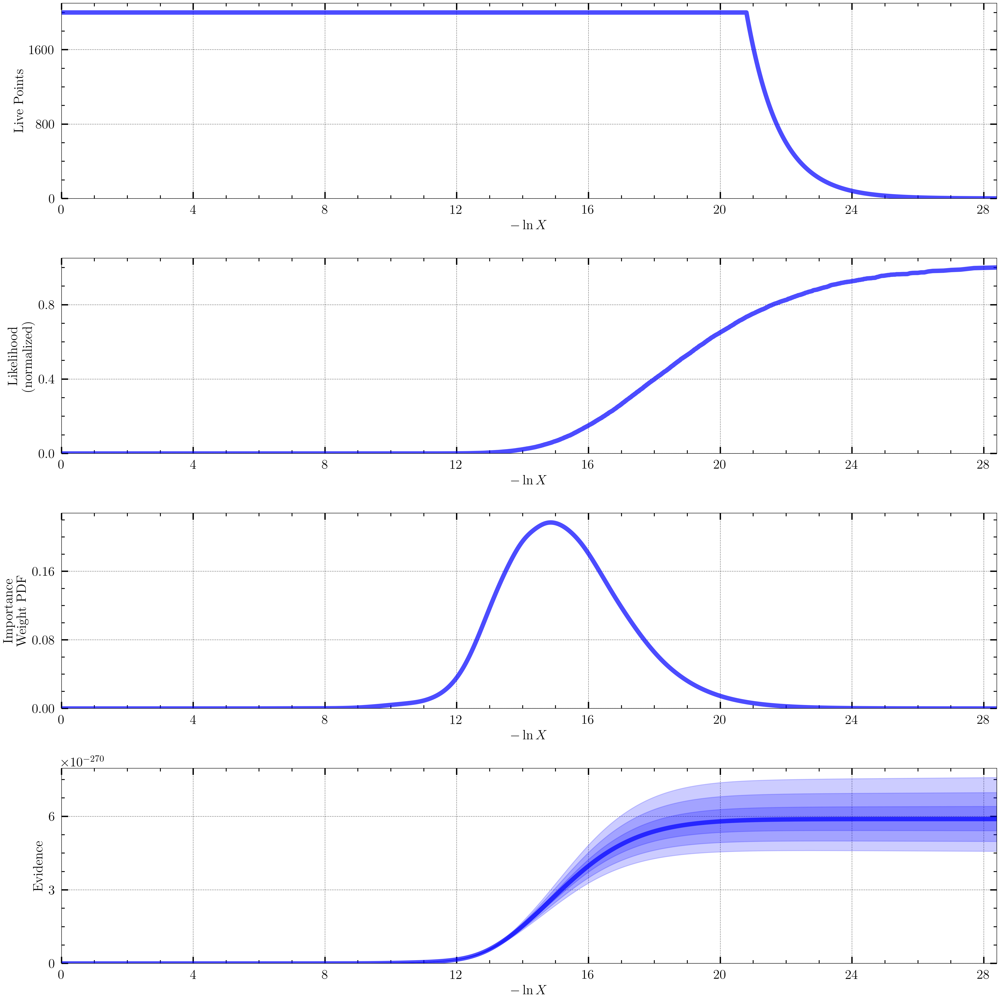

In [24]:
from dynesty import plotting as dyplot

dyplot.runplot(res)
plt.tight_layout()

Recall that the kernels look like:

$$ k_{SHO}(\tau, S_0, Q, \omega_0) = S_0 \omega_0 Q \exp(-\omega_0 \tau/2Q) \left[\cos(\eta \omega_0 \tau) + \dfrac{1}{2\eta Q} \sin(\eta \omega_0 \tau)\right] $$ 

where $\eta = |1-(4Q^2)^{-1}|^{1/2}$ , $\tau = |t_i - t_j|$, and

$$ k_{real}(\tau) = a_j \exp(-c_j \tau) $$

and the kernel used is the sum of these two.

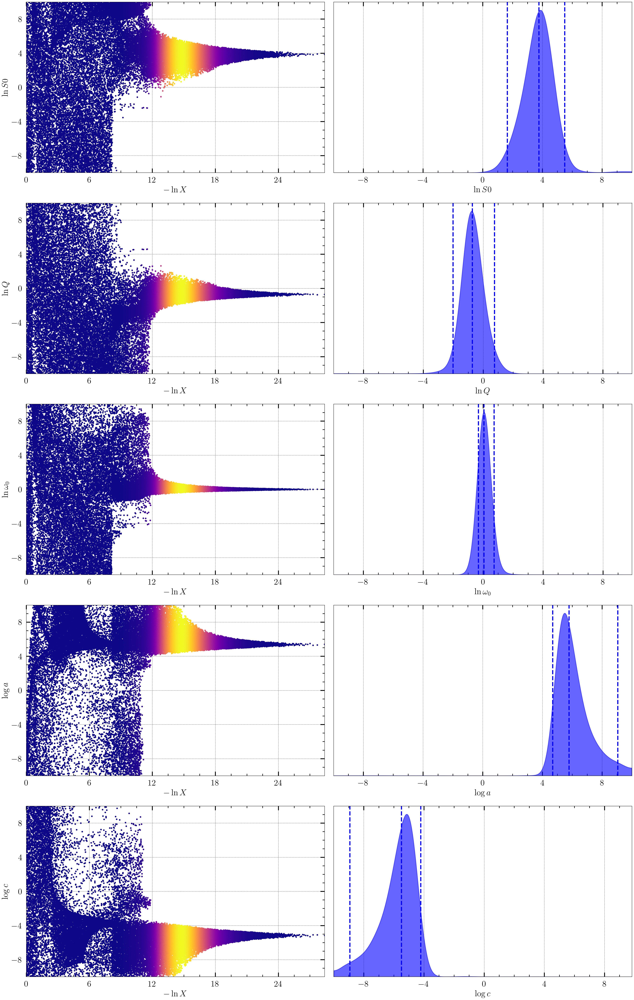

In [26]:
labels = [r'$\ln S0$', r'$\ln Q$', r'$\ln \omega_0$', r'$\log a$', r'$\log c$']
# truths = [logs0, logQ, logomega0,]
fig, axes = dyplot.traceplot(res, labels=labels,
                             fig=plt.subplots(5, 2, figsize=(16, 25)))
fig.tight_layout()

In [ ]:
fig, axes = dyplot.cornerplot(respos, truths=truths, show_titles=True, 
                              title_kwargs={'y': 1.04}, labels=labels,
                              fig=plt.subplots(3,3, figsize=(35, 35)))